##  Importing libraries

The code imports essential libraries for data analysis and visualization, and then reads in temperature and bin size datasets from CSV files.

In [1]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sn

In [2]:
# Read the CSV files
temperature_df = pd.read_csv(r"D:\tranzmeo assignement\temperature (1) (1).csv")
binsize_df = pd.read_csv(r"D:\tranzmeo assignement\BinSize (1).csv")

# 1. Familiarize yourself with the dataset, then write some python code which returns a line graph of the record high and record low temperatures by day of the year over the period 2005-2014. The area between the record high and record low temperatures for each day should be shaded. 

The code reads temperature data, converts the date column to a datetime format, and filters it for the years 2005-2014. It separates the data into high and low temperatures, adds a column for the day of the year, and calculates the daily record high and low temperatures. It then creates a line graph with shaded areas between these records to visualize temperature ranges by day of the year.

In [60]:
# Display the first few rows of each dataframe to understand their structure
print("Temperature DataFrame:")
print(temperature_df.head())

print("\nBinSize DataFrame:")
print(binsize_df.head())

Temperature DataFrame:
            ID       Date Element  Data_Value
0  USW00094889 2014-11-12    TMAX          22
1  USC00208972 2009-04-29    TMIN          56
2  USC00200032 2008-05-26    TMAX         278
3  USC00205563 2005-11-11    TMAX         139
4  USC00200230 2014-02-27    TMAX        -106

BinSize DataFrame:
            ID  LATITUDE  LONGITUDE  ELEVATION STATE                 NAME   
0  AE000041196    25.333     55.517       34.0   NaN  SHARJAH INTER. AIRP  \
1  AEM00041194    25.255     55.364       10.4   NaN           DUBAI INTL   
2  AEM00041217    24.433     54.651       26.8   NaN       ABU DHABI INTL   
3  AEM00041218    24.262     55.609      264.9   NaN          AL AIN INTL   
4  AFM00040990    31.500     65.850     1010.0   NaN     KANDAHAR AIRPORT   

  GSNFLAG HCNFLAG    WMOID             x             y   
0     GSN     NaN  41196.0  5.579578e+06  2.816905e+06  \
1     NaN     NaN  41194.0  5.567782e+06  2.808232e+06   
2     NaN     NaN  41217.0  5.532707e+06  2.

In [61]:
# Convert 'Date' column to datetime format
temperature_df['Date'] = pd.to_datetime(temperature_df['Date'])

In [62]:
# Filter data for the period 2005-2014 and for record high (TMAX) and record low (TMIN) temperatures
temperature_df = temperature_df[(temperature_df['Date'].dt.year >= 2005) & (temperature_df['Date'].dt.year <= 2014)]
temperature_df = temperature_df[temperature_df['Element'].isin(['TMAX', 'TMIN'])]

In [63]:
# Create separate DataFrames for high and low temperatures
highs = temperature_df[temperature_df['Element'] == 'TMAX'].copy()
lows = temperature_df[temperature_df['Element'] == 'TMIN'].copy()

In [64]:
# Add a 'DayOfYear' column for both high and low temperatures
highs['DayOfYear'] = highs['Date'].dt.dayofyear
lows['DayOfYear'] = lows['Date'].dt.dayofyear

In [65]:
# Pivot the data to get temperatures by day of the year
highs_pivot = highs.pivot_table(index='DayOfYear', values='Data_Value', aggfunc='max').reset_index()
lows_pivot = lows.pivot_table(index='DayOfYear', values='Data_Value', aggfunc='min').reset_index()

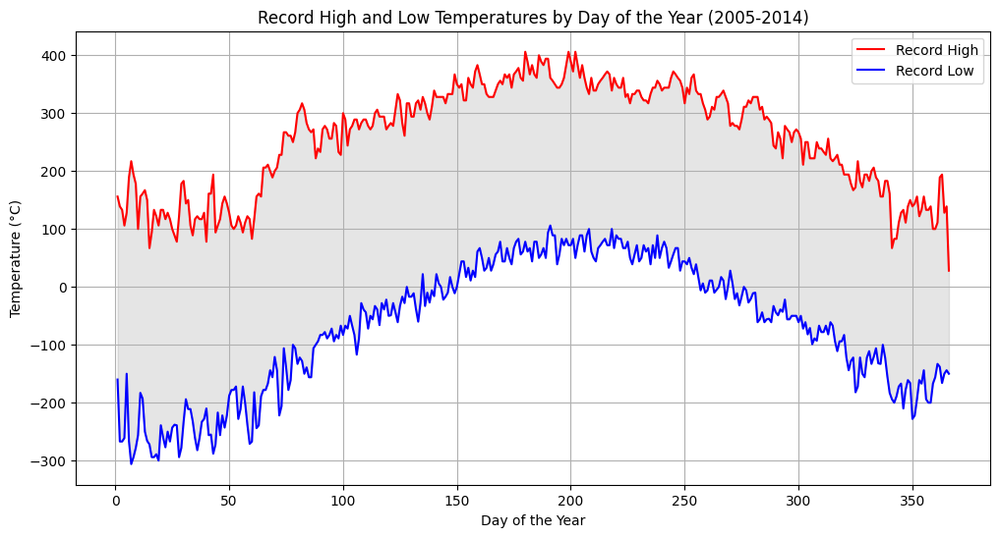

In [66]:
# Plotting
plt.figure(figsize=(12, 6))
plt.plot(highs_pivot['DayOfYear'], highs_pivot['Data_Value'], label='Record High', color='red')
plt.plot(lows_pivot['DayOfYear'], lows_pivot['Data_Value'], label='Record Low', color='blue')
plt.fill_between(highs_pivot['DayOfYear'], highs_pivot['Data_Value'], lows_pivot['Data_Value'], color='gray', alpha=0.2)
plt.xlabel('Day of the Year')
plt.ylabel('Temperature (°C)')
plt.title('Record High and Low Temperatures by Day of the Year (2005-2014)')
plt.legend()
plt.grid(True)
plt.show()

# 2. Overlay a scatter of the 2015 data for any points (highs and lows) for which the ten year record (2005-2014) record high or record low was broken in 2015. 


 The code reads temperature data for the years 2005-2014 and 2015, then calculates daily record high and low temperatures for the earlier period. It identifies any 2015 temperatures that exceed these records and plots a graph showing these broken records as scatter points. The graph includes a line plot of the record highs and lows for 2005-2014, with shaded areas between these records, and highlights any record-breaking temperatures from 2015.

In [67]:
# Convert 'Date' column to datetime format
temperature_df['Date'] = pd.to_datetime(temperature_df['Date'])

In [68]:
# Filter data for the period 2005-2014 and for record high (TMAX) and record low (TMIN) temperatures
temperature_df = temperature_df[(temperature_df['Date'].dt.year >= 2005) & (temperature_df['Date'].dt.year <= 2014)]
temperature_df = temperature_df[temperature_df['Element'].isin(['TMAX', 'TMIN'])]

In [69]:
# Create separate DataFrames for high and low temperatures
highs = temperature_df[temperature_df['Element'] == 'TMAX'].copy()
lows = temperature_df[temperature_df['Element'] == 'TMIN'].copy()

In [70]:
# Add a 'DayOfYear' column for both high and low temperatures
highs['DayOfYear'] = highs['Date'].dt.dayofyear
lows['DayOfYear'] = lows['Date'].dt.dayofyear

In [71]:
# Pivot the data to get record high and low temperatures by day of the year
highs_pivot = highs.pivot_table(index='DayOfYear', values='Data_Value', aggfunc='max').reset_index()
lows_pivot = lows.pivot_table(index='DayOfYear', values='Data_Value', aggfunc='min').reset_index()


In [72]:
# Load and filter data for the year 2015
temperature_2015_df = pd.read_csv(r"D:\tranzmeo assignement\temperature (1) (1).csv")
temperature_2015_df['Date'] = pd.to_datetime(temperature_2015_df['Date'])
temperature_2015_df = temperature_2015_df[temperature_2015_df['Date'].dt.year == 2015]
temperature_2015_df = temperature_2015_df[temperature_2015_df['Element'].isin(['TMAX', 'TMIN'])]

In [73]:
# Add a 'DayOfYear' column for 2015 data
temperature_2015_df['DayOfYear'] = temperature_2015_df['Date'].dt.dayofyear

In [74]:
# Separate 2015 data into highs and lows
highs_2015 = temperature_2015_df[temperature_2015_df['Element'] == 'TMAX']
lows_2015 = temperature_2015_df[temperature_2015_df['Element'] == 'TMIN']

In [75]:
# Find broken records
broken_highs = highs_2015[highs_2015['Data_Value'] > highs_pivot['Data_Value'].reindex(highs_2015['DayOfYear']).values]
broken_lows = lows_2015[lows_2015['Data_Value'] < lows_pivot['Data_Value'].reindex(lows_2015['DayOfYear']).values]


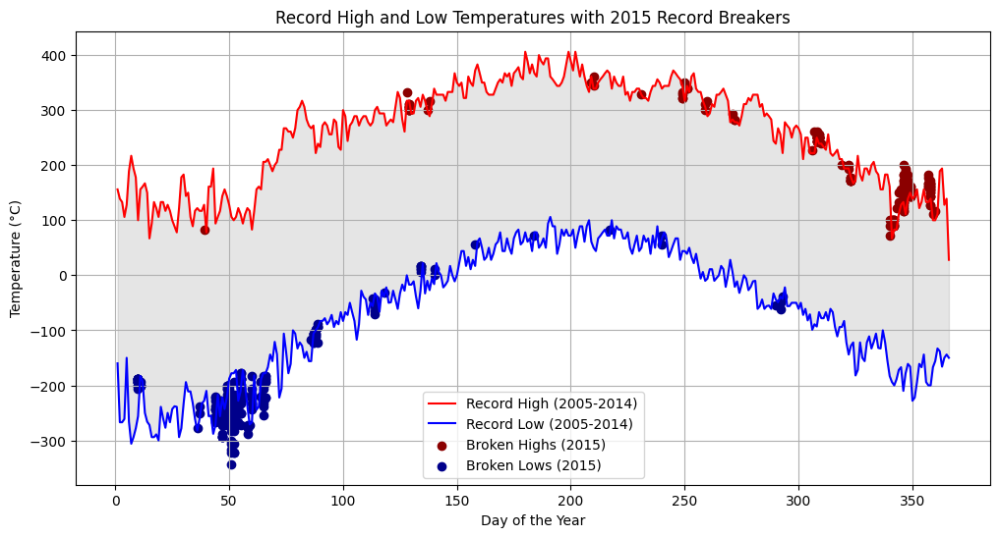

In [76]:
# Plotting
plt.figure(figsize=(12, 6))

# Plot 2005-2014 data
plt.plot(highs_pivot['DayOfYear'], highs_pivot['Data_Value'], label='Record High (2005-2014)', color='red')
plt.plot(lows_pivot['DayOfYear'], lows_pivot['Data_Value'], label='Record Low (2005-2014)', color='blue')
plt.fill_between(highs_pivot['DayOfYear'], highs_pivot['Data_Value'], lows_pivot['Data_Value'], color='gray', alpha=0.2)

# Plot 2015 data
plt.scatter(broken_highs['DayOfYear'], broken_highs['Data_Value'], color='darkred', label='Broken Highs (2015)')
plt.scatter(broken_lows['DayOfYear'], broken_lows['Data_Value'], color='darkblue', label='Broken Lows (2015)')

plt.xlabel('Day of the Year')
plt.ylabel('Temperature (°C)')
plt.title('Record High and Low Temperatures with 2015 Record Breakers')
plt.legend()
plt.grid(True)
plt.show()

# 3. Watch out for leap days (i.e. February 29th), it is reasonable to remove these points from the dataset for the purpose of this visualization. 

In this code, we filter the temperature data for the period 2005-2014 and exclude leap days (February 29th) from the dataset. This is done to ensure that these extra days, which do not occur annually, do not skew the temperature analysis. After filtering, the code checks if any leap days are still present in the dataset and prints a message to confirm their removal.

In [77]:
# Filter data for the period 2005-2014 and for record high (TMAX) and record low (TMIN) temperatures
temperature_df = temperature_df[(temperature_df['Date'].dt.year >= 2005) & (temperature_df['Date'].dt.year <= 2014)]
temperature_df = temperature_df[temperature_df['Element'].isin(['TMAX', 'TMIN'])]

In [78]:
# Remove leap days (February 29th) from the dataset
temperature_df = temperature_df[~((temperature_df['Date'].dt.month == 2) & (temperature_df['Date'].dt.day == 29))]

In [79]:
# Verify there are no leap days in the filtered dataset
leap_days_check = temperature_df[(temperature_df['Date'].dt.month == 2) & (temperature_df['Date'].dt.day == 29)]

# Print the results
if leap_days_check.empty:
    print("No leap days (February 29th) are present in the dataset.")
else:
    print("Leap days (February 29th) are present in the dataset.")

No leap days (February 29th) are present in the dataset.


# 4. Consider issues such as legends, labels, and chart junk. 


 In this step:


1. **Clear Legends**: Added clear legends for record highs and lows from 2005-2014, and for broken records in 2015, to differentiate between data series.

2. **Enhanced Labels**: Included axis labels ("Day of the Year" and "Temperature (°C)") and a descriptive title for clarity.

3. **Minimized Chart Junk**: Used a clean grid, simplified design, and avoided unnecessary visual elements to focus on the data.

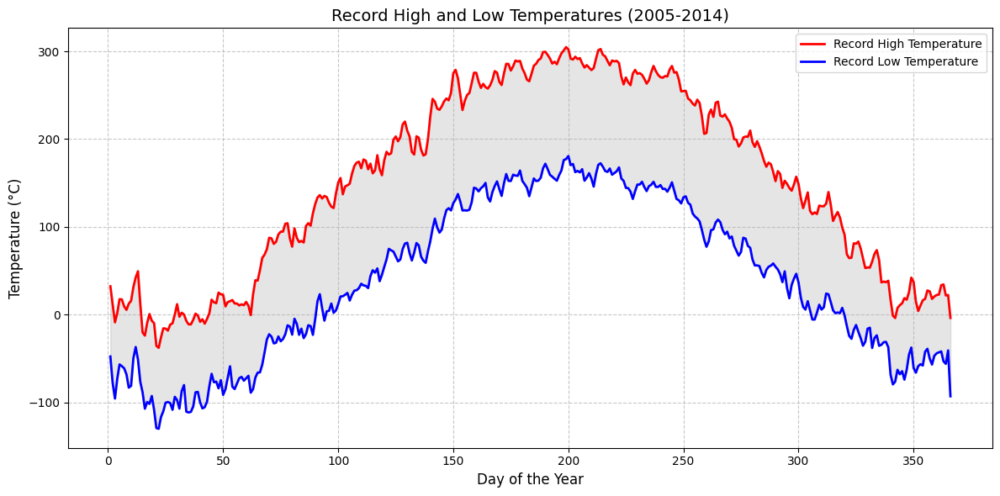

In [112]:
import pandas as pd
import matplotlib.pyplot as plt

# data is already loaded and filtered as required

# Plot record high and low temperatures
plt.figure(figsize=(12, 6))
plt.plot(highs_pivot['DayOfYear'], highs_pivot['Data_Value'], label='Record High Temperature', color='red', linewidth=2)
plt.plot(lows_pivot['DayOfYear'], lows_pivot['Data_Value'], label='Record Low Temperature', color='blue', linewidth=2)
plt.fill_between(highs_pivot['DayOfYear'], highs_pivot['Data_Value'], lows_pivot['Data_Value'], color='gray', alpha=0.2)

# Title and labels
plt.title('Record High and Low Temperatures (2005-2014)', fontsize=14)
plt.xlabel('Day of the Year', fontsize=12)
plt.ylabel('Temperature (°C)', fontsize=12)

# Add legend
plt.legend(loc='best')

# Grid for clarity
plt.grid(True, linestyle='--', alpha=0.7)

# Remove chart junk (e.g., excessive decorations)
plt.tight_layout()

# Show plot
plt.show()


# 5. The data you have been given is near **Ann Arbor, Michigan, United States**, and visualize on map the stations the data.

This code visualizes weather stations near Ann Arbor, Michigan, on an interactive map. After installing the `folium` library, it creates a map centered on Ann Arbor and places markers for each weather station using their latitude and longitude. Each marker includes a popup with the station's name and ID. The map is then saved as an HTML file for viewing in a web browser.

In [86]:
!pip install folium



[notice] A new release of pip is available: 24.0 -> 24.2
[notice] To update, run: C:\Users\aruni\AppData\Local\Programs\Python\Python310\python.exe -m pip install --upgrade pip


In [105]:
import folium
from folium.plugins import MarkerCluster


In [108]:
# Extract relevant columns for mapping
stations_df = binsize_df[['ID', 'LATITUDE', 'LONGITUDE', 'NAME']]

# Create a map centered around Ann Arbor, Michigan
map_1 = folium.Map(location=[42.2808, -83.7430], zoom_start=10)

# Add markers for each station using MarkerCluster
marker_cluster = MarkerCluster().add_to(map_1)
for _, row in stations_df.iterrows():
    folium.Marker(
        location=[row['LATITUDE'], row['LONGITUDE']],
        popup=row['NAME'] + ' (' + row['ID'] + ')'
    ).add_to(marker_cluster)

# Display the map
map_1

In [109]:
map_1.save("ann_arbor_stations_map.html")

# 6. Plot Temperature Summary near Ann Arbor, Michigan, United States (Year 2015).

This code plots the temperature summary for the year 2015 specifically for weather stations near Ann Arbor, Michigan. It first filters the stations and temperature data for the relevant geographic area. Then, it adds a 'DayOfYear' column to the temperature data to facilitate daily aggregation. The code calculates the daily maximum and minimum temperatures and plots these values over the year, shading the area between the daily highs and lows. The resulting plot shows the temperature variation throughout the year for the specified region.



In [92]:
# Filter the stations to get only those near Ann Arbor, Michigan
ann_arbor_stations = stations_df[(stations_df['LATITUDE'].between(42.0, 43.0)) & 
                                 (stations_df['LONGITUDE'].between(-84.0, -83.0))]

# Filter temperature data for 2015 and only for Ann Arbor area stations
temperature_2015_ann_arbor = temperature_2015_df[temperature_2015_df['ID'].isin(ann_arbor_stations['ID'])]

# Add 'DayOfYear' column using .loc to avoid SettingWithCopyWarning
temperature_2015_ann_arbor.loc[:, 'DayOfYear'] = temperature_2015_ann_arbor['Date'].dt.dayofyear

# Group by day of the year and aggregate to get the daily max and min
# Extract max and min temperatures by day
highs_2015 = temperature_2015_ann_arbor[temperature_2015_ann_arbor['Element'] == 'TMAX'].groupby('DayOfYear')['Data_Value'].max()
lows_2015 = temperature_2015_ann_arbor[temperature_2015_ann_arbor['Element'] == 'TMIN'].groupby('DayOfYear')['Data_Value'].min()

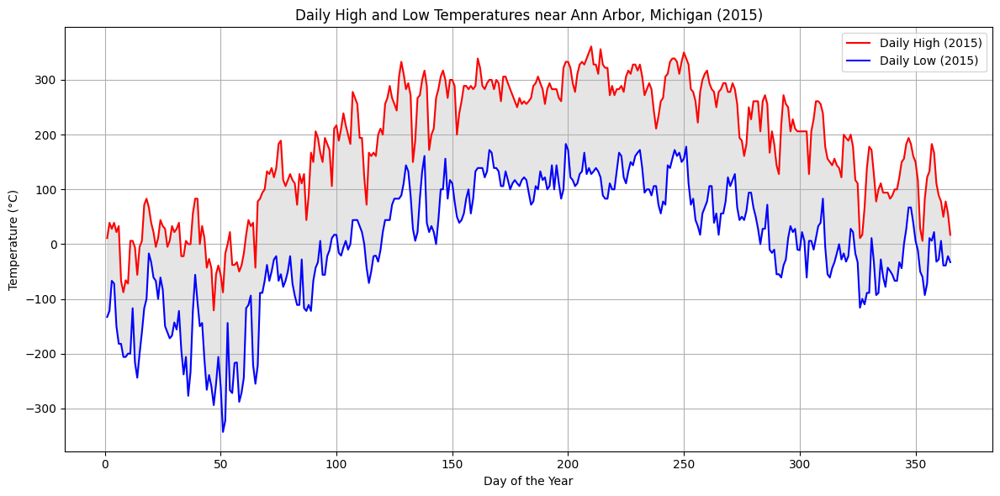

In [93]:
# Plotting the data
plt.figure(figsize=(12, 6))
plt.plot(highs_2015.index, highs_2015.values, label='Daily High (2015)', color='red')
plt.plot(lows_2015.index, lows_2015.values, label='Daily Low (2015)', color='blue')
plt.fill_between(highs_2015.index, highs_2015.values, lows_2015.values, color='gray', alpha=0.2)

# Enhancing the plot with labels, legends, and a title
plt.title('Daily High and Low Temperatures near Ann Arbor, Michigan (2015)')
plt.xlabel('Day of the Year')
plt.ylabel('Temperature (°C)')
plt.legend(loc='best')
plt.grid(True)
plt.tight_layout()

# Show plot
plt.show()
